In [3]:
import os
import torch
import torch.nn as nn
import models.VAE as vae
from tqdm import tqdm
import numpy as np
import argparse
import nibabel as nib
from models import LDM, Encoder, Tokenizer, Scheduler

In [1]:
frame = 8
repeat_num = 4
sample_num = 1
device = 'cuda:1'
checkpoint = "/home/xuruipeng/workspace/fmri-diff/weights/vae_best.pth"
LDM_checkpoint = '/home/xuruipeng/workspace/fmri-diff/weights/unet_new_400.pth'
asd_hc = 'asd'


In [4]:
class VAE_Decoder(nn.Module):
    def __init__(self):
        super(VAE_Decoder, self).__init__()
        self.vae = vae.VAE()
        self.load_checkpoint(checkpoint)

    def load_checkpoint(self, checkpoint):
        self.vae.load_state_dict(torch.load(checkpoint))
        print('VAE Decoder Model loaded from checkpoint...Done')

    def forward(self, x):

        h_coronal = x[:, :4]
        h_sagittal = x[:, 4:8]
        h_axial = x[:, 8:]
        # print(h_coronal.shape, h_sagittal.shape, h_axial.shape)
        # decode
        coronal = self.vae.VAE_Coronal.decoder(h_coronal)
        sagittal = self.vae.VAE_Sagittal.decoder(h_sagittal)
        axial = self.vae.VAE_Axial.decoder(h_axial)

        # torch.Size([n, 73, 61, 61]) torch.Size([n, 61, 73, 61]) torch.Size([n, 61, 73, 61])
        # print(coronal.shape, sagittal.shape, axial.shape)

        coronal = coronal.permute((0, 2, 1, 3))  
        axial = axial.permute((0, 3, 2, 1))  

        # combine the three views
        out = (coronal + sagittal + axial) / 3

        return out

In [5]:
encoder = Encoder.getEncoder().to(device)
scheduler = Scheduler.get_scheduler()
tokenizer = Tokenizer.get_tokenizer()
unet = LDM.UNet(frame).to(device)
vae_decoder = VAE_Decoder().to(device)

unet.load_state_dict(torch.load(LDM_checkpoint, map_location=device))
encoder.eval()
# vae.eval()
unet.eval()
vae_decoder.eval()

brain_mask = nib.load("./datas/mask.nii.gz")
brain_mask = brain_mask.get_fdata()

dx_group = {'asd': "Autism Spectrum Disorder", 'hc': "Healthy Control"}

VAE Decoder Model loaded from checkpoint...Done


In [6]:
def generate(text, pre_frame=None):

    #[1, 77]
    # print(text)
    pos = tokenizer(text,
                    padding='max_length',
                    max_length=77,
                    truncation=True,
                    return_tensors='pt').input_ids.to(device)

    pos = encoder(pos)
    out_encoder = pos


    out_vae = torch.randn_like(pre_frame).to(device)

    scheduler.set_timesteps(50, device=device)
    with torch.no_grad():
        for time in scheduler.timesteps:
            
            noise = out_vae
            noise = scheduler.scale_model_input(noise, time)

            #[2, 4, 64, 64],[2, 77, 768],scala -> [2, 4, 64, 64]
            pred_noise = unet(out_vae=torch.cat((noise, pre_frame), dim=1), out_encoder=out_encoder, time=time)

            #[1, 4, 64, 64]
            out_vae = scheduler.step(pred_noise, time, out_vae).prev_sample

    out_vae = 1 / 0.18215 * out_vae
    #[1, 4, 64, 64] -> [1, 3, 512, 512]
    # print('out', out_vae.shape)
    return out_vae

In [7]:
img_affine = np.array([[-3., -0., 0., 90.], [-0., 3., -0., -126.], [0., 0., 3., -72.], [0., 0., 0., 1.]])

In [9]:
all_outs = []
data = torch.zeros((1, 12*frame, 64, 64)).to(device)
with torch.no_grad():
    for s in tqdm(range(repeat_num)):
        data = generate(dx_group[asd_hc], data)

        outs = torch.cat([data[:, _*12:(_+1)*12, :, :] for _ in range(frame)], dim=0)

        # print(outs.shape)

        # VAE decode process
        outs = vae_decoder(outs)
        # print(outs.shape)
        all_outs.append(outs)

all_outs = torch.cat(all_outs, dim=0)
# print(all_outs.shape)
all_outs = all_outs.cpu().numpy()

mask = np.stack([brain_mask] * all_outs.shape[0], axis=0)
all_outs = all_outs * brain_mask
# all_outs = np.transpose(all_outs, (1, 2, 3, 0))

# new_image = nib.Nifti1Image(all_outs, img_affine)


100%|██████████| 4/4 [00:15<00:00,  3.96s/it]


In [11]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import LinearSegmentedColormap
print(all_outs.shape)
cdict = {
    'red':   ((0.0, 0.0, 0.0),
              (0.5, 1.0, 1.0),  
              (1.0, 1.0, 1.0)), 
    'green': ((0.0, 0.0, 0.0),
              (0.5, 1.0, 1.0),
              (1.0, 0.0, 0.0)),
    'blue':  ((0.0, 1.0, 1.0),
              (0.5, 1.0, 1.0),
              (1.0, 0.0, 0.0))
}
cmap = LinearSegmentedColormap('custom_cmap', cdict)
# cmap = plt.cm.jet 
# cmap = plt.cm.viridis
# cmap = plt.cm.cividis
cmap.set_bad('white', 1.) 

vmin = np.percentile(all_outs, 99) 
vmax = np.percentile(all_outs, 1) 
print(vmin, vmax)

(32, 61, 73, 61)
54.105729103088365 -54.25793018341064


In [21]:
images = []
mask_data = np.where(brain_mask == 0, np.nan, all_outs)

save_dir = './logs/runs'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

for t in range(mask_data.shape[0]):
    fig, ax = plt.subplots()
    z_slice = mask_data.shape[1] // 2 
    data = mask_data[t, z_slice, :, :].T

    data = np.flipud(data)
    data = np.fliplr(data)
    img = ax.imshow(data, cmap=cmap, vmin=-100, vmax=100)
    fig.colorbar(img, ax=ax, extend='both')
    ax.set_title(f'Time Point: {t + 1}')
    plt.savefig(save_dir+'/volume_{}.png'.format(str(t+1)), dpi=300, bbox_inches='tight')
    plt.close(fig)


In [22]:
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols
    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [24]:

imgs = []
for i in range(mask_data.shape[0]):
    img = Image.open(save_dir+'/volume_{}.png'.format(str(i+1)))
    imgs.append(img)
grid = image_grid(imgs, repeat_num, frame)
grid

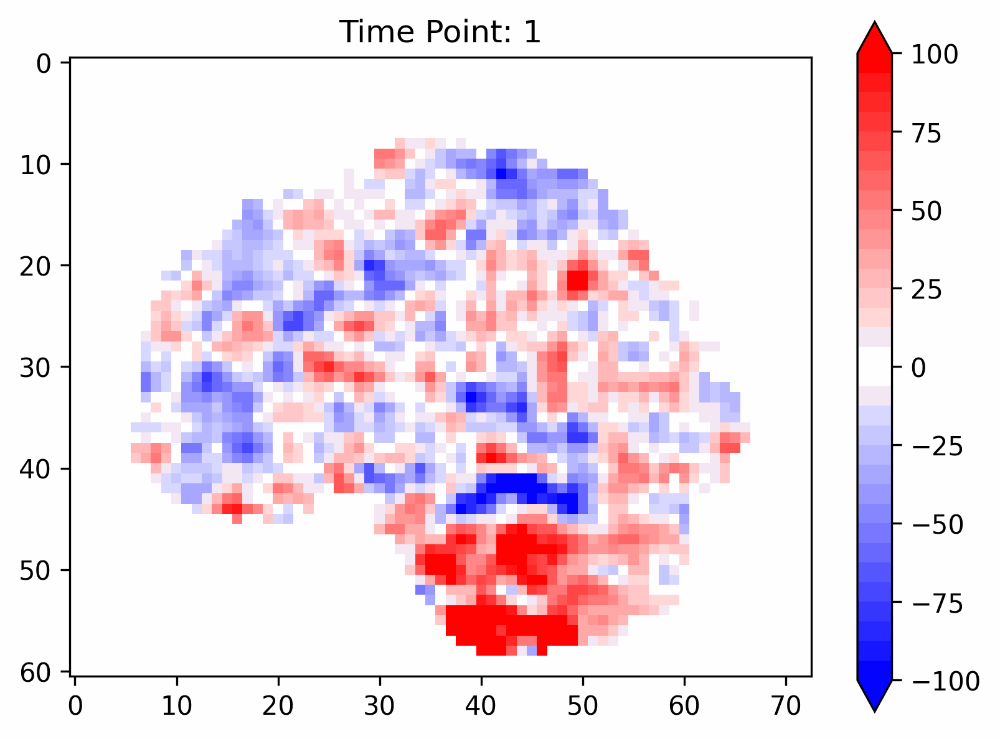

In [27]:
# gen gif
import imageio
imageio.mimsave(save_dir+'/movie.gif', imgs, duration=0.5)
# show gif
from IPython.display import Image
Image(filename=save_dir+'/movie.gif')
